In [24]:
! pip install SpeechRecognition

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [26]:

import IPython.display as ipd
import librosa.display
import librosa
import numpy as np

In [27]:
audio=ipd.Audio("/content/voice-data.wav")
audio

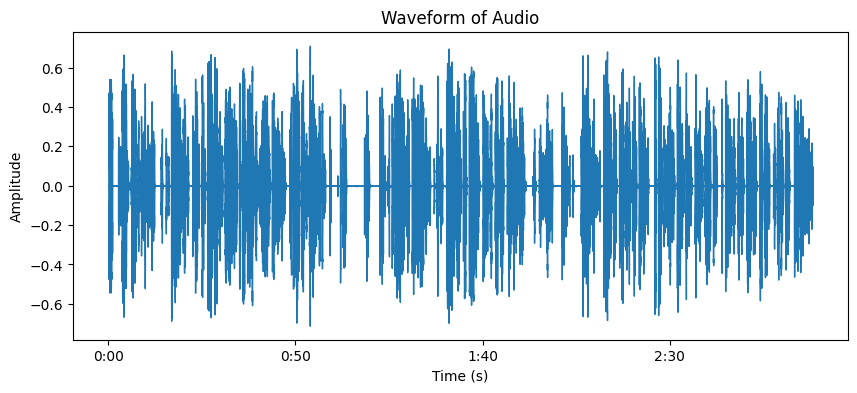

In [28]:
audio_path = "/content/voice-data.wav"
y, sr = librosa.load(audio_path)
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform of Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

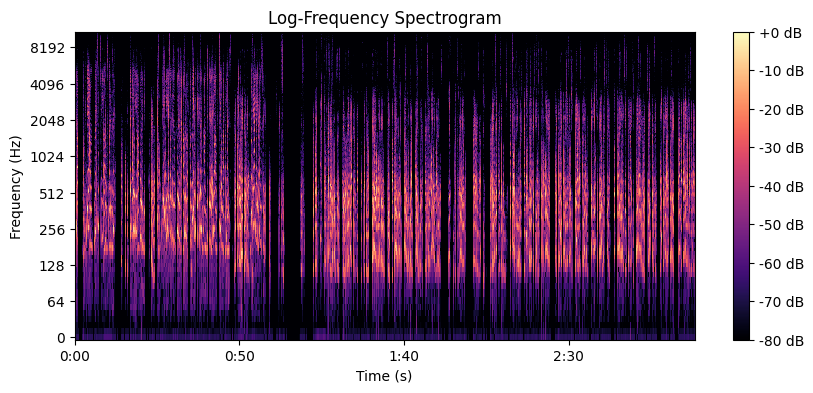

In [29]:
plt.figure(figsize=(10, 4))
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Frequency Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.show()

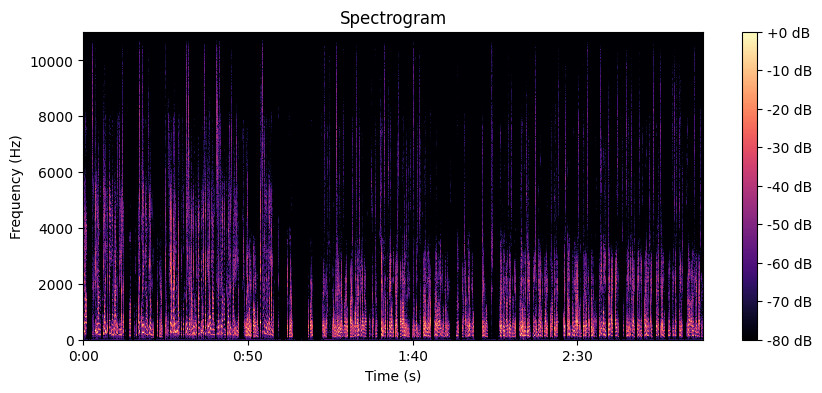

In [30]:
plt.figure(figsize=(10, 4))
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)  # Short-time Fourier Transform
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.show()

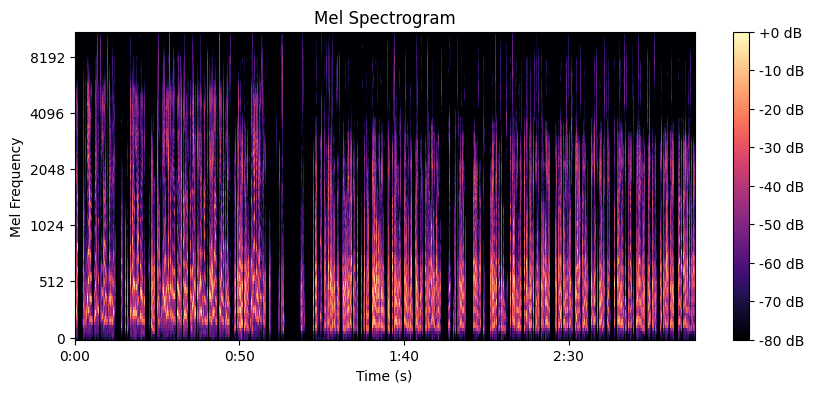

In [31]:
plt.figure(figsize=(10, 4))
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Mel Frequency')
plt.show()

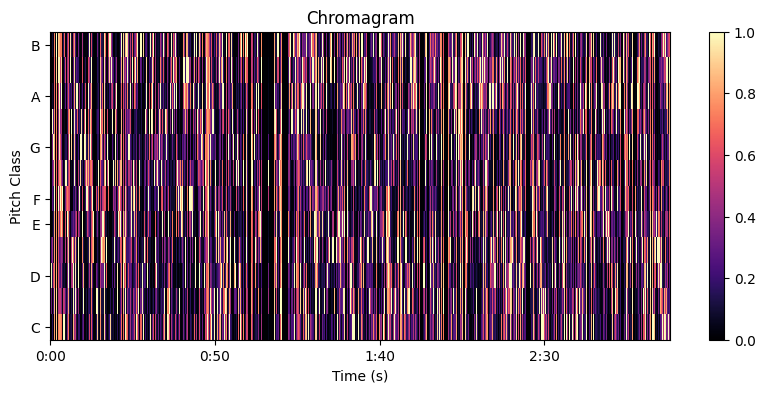

In [32]:
plt.figure(figsize=(10, 4))
chroma = librosa.feature.chroma_stft(y=y, sr=sr)
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.xlabel('Time (s)')
plt.ylabel('Pitch Class')
plt.show()

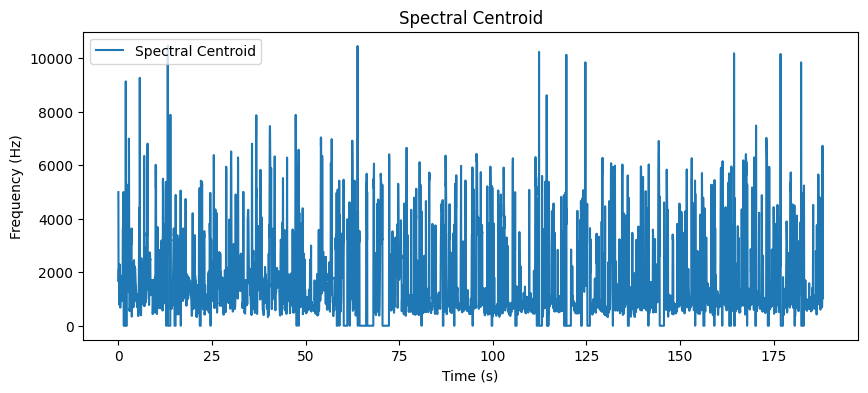

In [33]:
plt.figure(figsize=(10, 4))
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
times = librosa.times_like(spectral_centroids)
plt.plot(times, spectral_centroids, label='Spectral Centroid')
plt.title('Spectral Centroid')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.show()

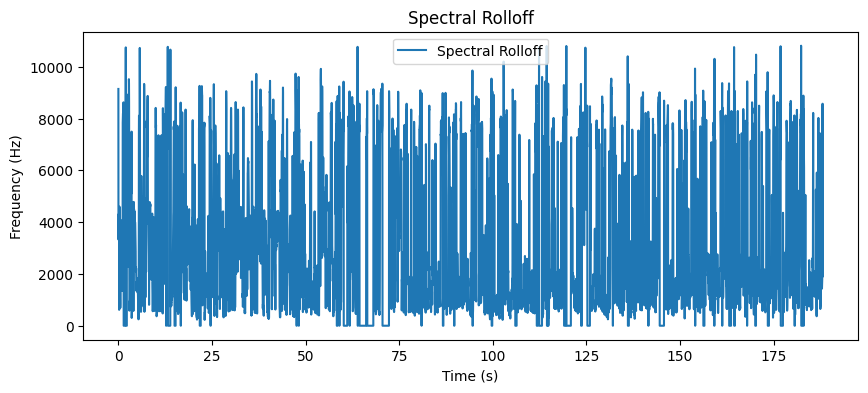

In [34]:
plt.figure(figsize=(10, 4))
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=0.85)[0]
times = librosa.times_like(spectral_rolloff)
plt.plot(times, spectral_rolloff, label='Spectral Rolloff')
plt.title('Spectral Rolloff')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.show()

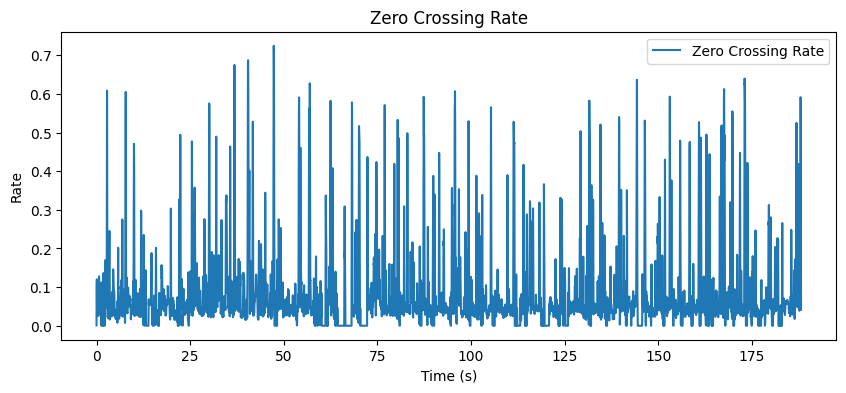

In [35]:
plt.figure(figsize=(10, 4))
zero_crossings = librosa.feature.zero_crossing_rate(y)[0]
times = librosa.times_like(zero_crossings)
plt.plot(times, zero_crossings, label='Zero Crossing Rate')
plt.title('Zero Crossing Rate')
plt.xlabel('Time (s)')
plt.ylabel('Rate')
plt.legend()
plt.show()

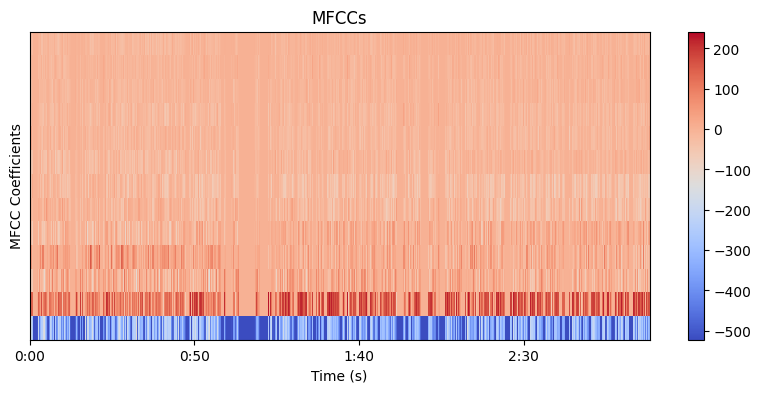

In [36]:
plt.figure(figsize=(10, 4))
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCCs')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()

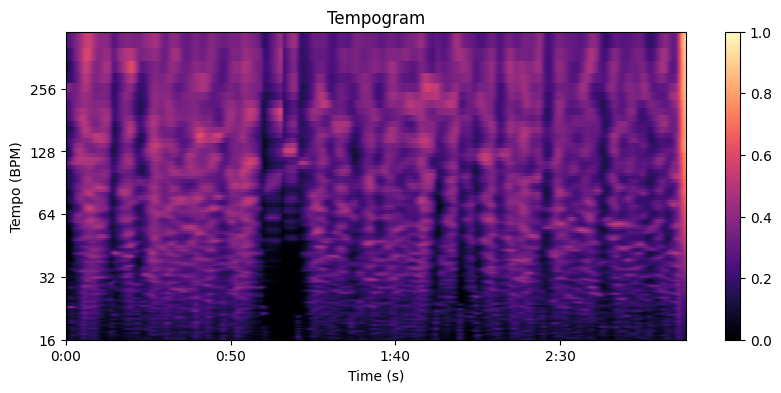

In [37]:
plt.figure(figsize=(10, 4))
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
tempogram = librosa.feature.tempogram(y=y, sr=sr)
librosa.display.specshow(tempogram, sr=sr, x_axis='time', y_axis='tempo')
plt.colorbar()
plt.title('Tempogram')
plt.xlabel('Time (s)')
plt.ylabel('Tempo (BPM)')
plt.show()

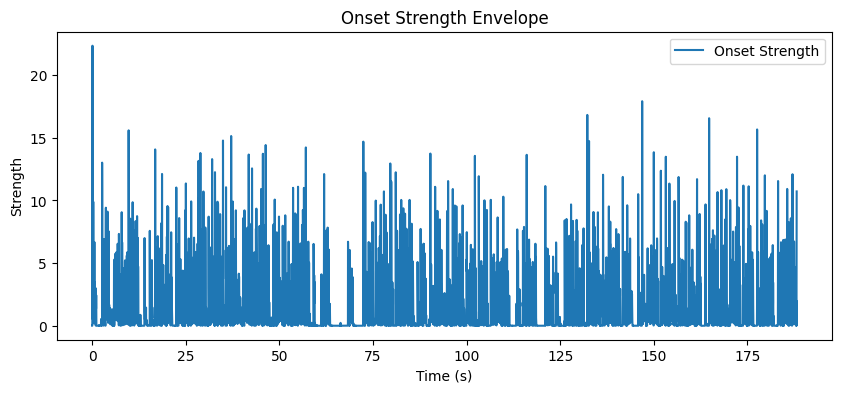

In [38]:
plt.figure(figsize=(10, 4))
onset_env = librosa.onset.onset_strength(y=y, sr=sr)
times = librosa.times_like(onset_env)
plt.plot(times, onset_env, label='Onset Strength')
plt.title('Onset Strength Envelope')
plt.xlabel('Time (s)')
plt.ylabel('Strength')
plt.legend()
plt.show()

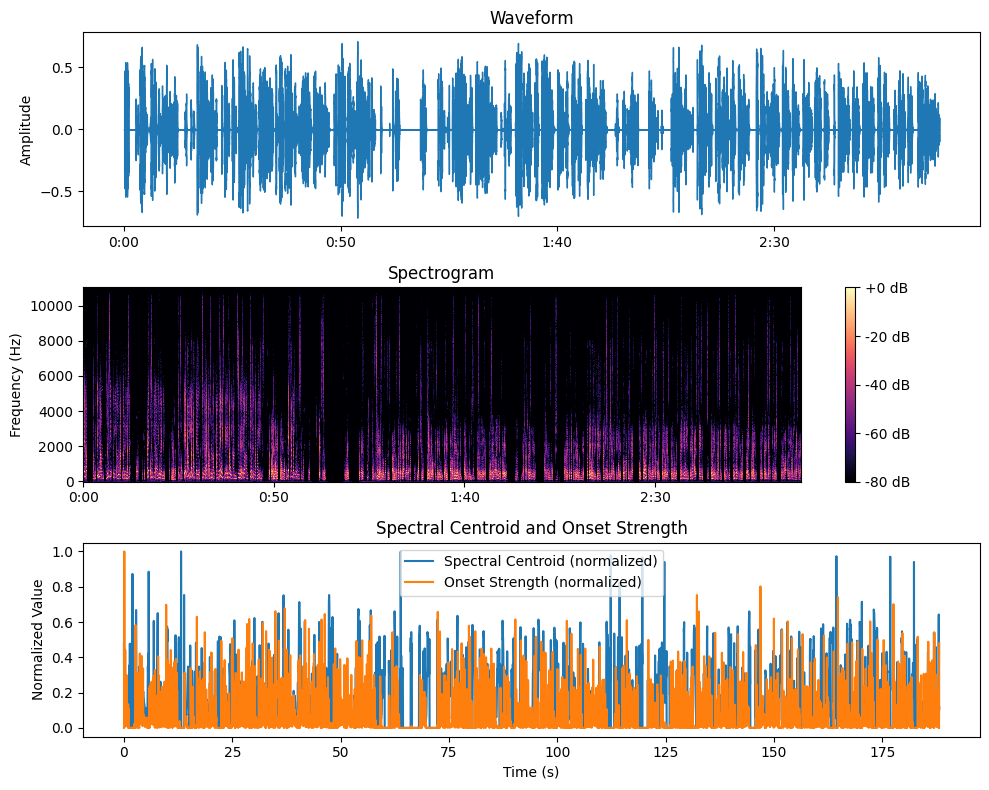

In [39]:
plt.figure(figsize=(10, 8))

# Waveform
plt.subplot(3, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.xlabel('')
plt.ylabel('Amplitude')

# Spectrogram
plt.subplot(3, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('')
plt.ylabel('Frequency (Hz)')

# Spectral Centroid + Onset Strength
plt.subplot(3, 1, 3)
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
onset_env = librosa.onset.onset_strength(y=y, sr=sr)
times = librosa.times_like(spectral_centroids)
plt.plot(times, spectral_centroids / spectral_centroids.max(), label='Spectral Centroid (normalized)')
plt.plot(times, onset_env / onset_env.max(), label='Onset Strength (normalized)')
plt.legend()
plt.title('Spectral Centroid and Onset Strength')
plt.xlabel('Time (s)')
plt.ylabel('Normalized Value')

plt.tight_layout()
plt.show()

In [40]:
import speech_recognition as sr
recognizer = sr.Recognizer()
audio_file = sr.AudioFile("/content/voice-data.wav")
type(audio_file)

speech_recognition.AudioFile

In [41]:
with audio_file as source:
    audio_file = recognizer.record(source)
    result=recognizer.recognize_google(audio_data=audio_file)

In [42]:
audio_file = sr.AudioFile("/content/voice-data.wav")
with audio_file as source:
    audio_file = recognizer.record(source, duration = 5.0)
    result1 = recognizer.recognize_google(audio_data=audio_file)

In [43]:
audio_file = sr.AudioFile("/content/voice-data.wav")
with audio_file as source:
    audio_file = recognizer.record(source, offset = 2.0)
    result2 = recognizer.recognize_google(audio_data=audio_file)

In [44]:
audio_file = sr.AudioFile("/content/voice-data.wav")
with audio_file as source:
    audio_file = recognizer.record(source, duration= 5.0, offset = 2.0)
    result3 = recognizer.recognize_google(audio_data=audio_file)

In [45]:
audio_file = sr.AudioFile("/content/voice-data.wav")
with audio_file as source:
    recognizer.adjust_for_ambient_noise(source, duration=0.5)
    audio = recognizer.record(source)

result4= recognizer.recognize_google(audio)

In [46]:
from tabulate import tabulate

# Create a table
data = [
    ["result", result],
    ["result1", result1],
    ["result2", result2],
    ["result3", result3],
    ["result4", result4]
]

# Print in table format
print(tabulate(data, headers=["Variable", "Value"], tablefmt="grid"))

+------------+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [48]:
result_str= result.split(' ')
print(result_str)

['Eden', 'would', 'you', 'be', 'then', 'you', 'know', 'locking', 'this', 'meeting', 'in', 'so', 'that', 'we', "don't", 'have', 'no', 'participants', 'because', 'once', 'the', 'division', 'of', 'team', 'is', 'done', 'and', 'stuff', 'like', 'that', 'what', 'does', 'it', 'or', 'is', 'it', 'okay', 'if', 'people', 'if', 'more', 'people', 'join', 'in', 'the', 'game', 'you', 'can', 'play', 'I', 'think', 'we', 'have', 'about', '186.009%', 'but', 'one', 'among', 'you', 'one', 'among', 'you', 'will', 'be', 'joining', 'us', 'by', 'Master', 'for', 'each', 'of', 'the', 'team', 'so', 'red', 'team', 'will', 'have', 'a', 'red', 'spider', 'and', 'the', 'blue', 'team', 'will', 'have', 'blue', 'sky', 'master', 'and', 'basically', 'the', 'aim', 'of', 'each', 'team', 'is', 'to', 'figure', 'out', 'where', "there's", 'spy', 'agency', 'so', 'for', 'example', 'in', 'this', 'case', 'the', 'blue', 'team', 'has', 'nine', 'agents', 'and', 'the', 'red', 'team', 'has', 'eight', 'by', 'agents', 'and', 'their', 'hidde

In [49]:
unique_words = set(result_str)
print(unique_words)
print("The number of different words used: ",len(unique_words))

{'think', 'once', 'participants', 'more', 'play', 'case', 'in', 'or', 'to', 'location', "don't", 'teams', 'out', 'where', 'so', 'their', 'then', 'eight', 'done', 'we', 'make', 'what', 'people', 'it', 'aim', 'a', 'join', 'among', 'if', 'from', 'agents', 'division', 'stuff', 'my', 'team', 'sky', 'each', 'words', 'like', 'knows', 'be', 'I', 'would', 'have', 'for', 'this', "I'll", '186.009%', 'no', 'about', 'us', 'Master', 'respective', 'has', 'spider', "there's", 'of', 'and', 'Eden', 'protected', 'okay', 'somewhere', 'joining', 'that', 'secret', 'word', 'agency', 'will', 'one', 'basically', 'hidden', 'example', 'know', 'only', 'locking', 'because', 'money', 'does', 'red', 'is', 'master', 'the', 'some', 'spy', 'nine', 'game', 'figure', 'by', 'blue', 'can', 'meeting', 'you', 'but', '2500'}
The number of different words used:  94


In [50]:
word_dict = {}
for word in result_str:
    word_dict[word] = 0
print(word_dict)

{'Eden': 0, 'would': 0, 'you': 0, 'be': 0, 'then': 0, 'know': 0, 'locking': 0, 'this': 0, 'meeting': 0, 'in': 0, 'so': 0, 'that': 0, 'we': 0, "don't": 0, 'have': 0, 'no': 0, 'participants': 0, 'because': 0, 'once': 0, 'the': 0, 'division': 0, 'of': 0, 'team': 0, 'is': 0, 'done': 0, 'and': 0, 'stuff': 0, 'like': 0, 'what': 0, 'does': 0, 'it': 0, 'or': 0, 'okay': 0, 'if': 0, 'people': 0, 'more': 0, 'join': 0, 'game': 0, 'can': 0, 'play': 0, 'I': 0, 'think': 0, 'about': 0, '186.009%': 0, 'but': 0, 'one': 0, 'among': 0, 'will': 0, 'joining': 0, 'us': 0, 'by': 0, 'Master': 0, 'for': 0, 'each': 0, 'red': 0, 'a': 0, 'spider': 0, 'blue': 0, 'sky': 0, 'master': 0, 'basically': 0, 'aim': 0, 'to': 0, 'figure': 0, 'out': 0, 'where': 0, "there's": 0, 'spy': 0, 'agency': 0, 'example': 0, 'case': 0, 'has': 0, 'nine': 0, 'agents': 0, 'eight': 0, 'their': 0, 'hidden': 0, 'somewhere': 0, '2500': 0, 'words': 0, 'location': 0, 'protected': 0, 'secret': 0, 'word': 0, 'only': 0, 'respective': 0, 'teams': 0,

In [51]:
for word in result_str:
    word_dict[word] = word_dict[word] + 1
print("The count for each word spoken number of times are: ",word_dict)

The count for each word spoken number of times are:  {'Eden': 1, 'would': 1, 'you': 5, 'be': 2, 'then': 2, 'know': 1, 'locking': 1, 'this': 3, 'meeting': 1, 'in': 4, 'so': 5, 'that': 2, 'we': 2, "don't": 1, 'have': 4, 'no': 1, 'participants': 1, 'because': 1, 'once': 1, 'the': 9, 'division': 1, 'of': 3, 'team': 8, 'is': 4, 'done': 1, 'and': 7, 'stuff': 1, 'like': 1, 'what': 1, 'does': 1, 'it': 2, 'or': 1, 'okay': 1, 'if': 2, 'people': 2, 'more': 1, 'join': 2, 'game': 1, 'can': 1, 'play': 1, 'I': 2, 'think': 1, 'about': 1, '186.009%': 1, 'but': 1, 'one': 2, 'among': 2, 'will': 4, 'joining': 1, 'us': 2, 'by': 4, 'Master': 2, 'for': 3, 'each': 2, 'red': 3, 'a': 1, 'spider': 1, 'blue': 3, 'sky': 1, 'master': 1, 'basically': 1, 'aim': 1, 'to': 1, 'figure': 1, 'out': 1, 'where': 1, "there's": 1, 'spy': 1, 'agency': 1, 'example': 2, 'case': 1, 'has': 2, 'nine': 1, 'agents': 2, 'eight': 1, 'their': 2, 'hidden': 1, 'somewhere': 1, '2500': 1, 'words': 1, 'location': 2, 'protected': 1, 'secret': 

In [52]:
cols= ['Repetition']
count_df= pd.DataFrame.from_dict(word_dict,orient ='index',columns=cols)
count_df= count_df.reset_index()
count_df= count_df.rename(columns = {'index':'Word'})

In [53]:
count_df.head()

,Word,Repetition
0,Eden,1
1,would,1
2,you,5
3,be,2
4,then,2


In [54]:
print("Total number of words spoken per minute : ",(len(result_str)/3.08))

Total number of words spoken per minute :  54.54545454545455
